##camera calibration

In [104]:
import pickle
import os, glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib qt
%matplotlib inline

objpoints.shape :  (17, 54, 3)
imgpoints.shape :  (17, 54, 1, 2)


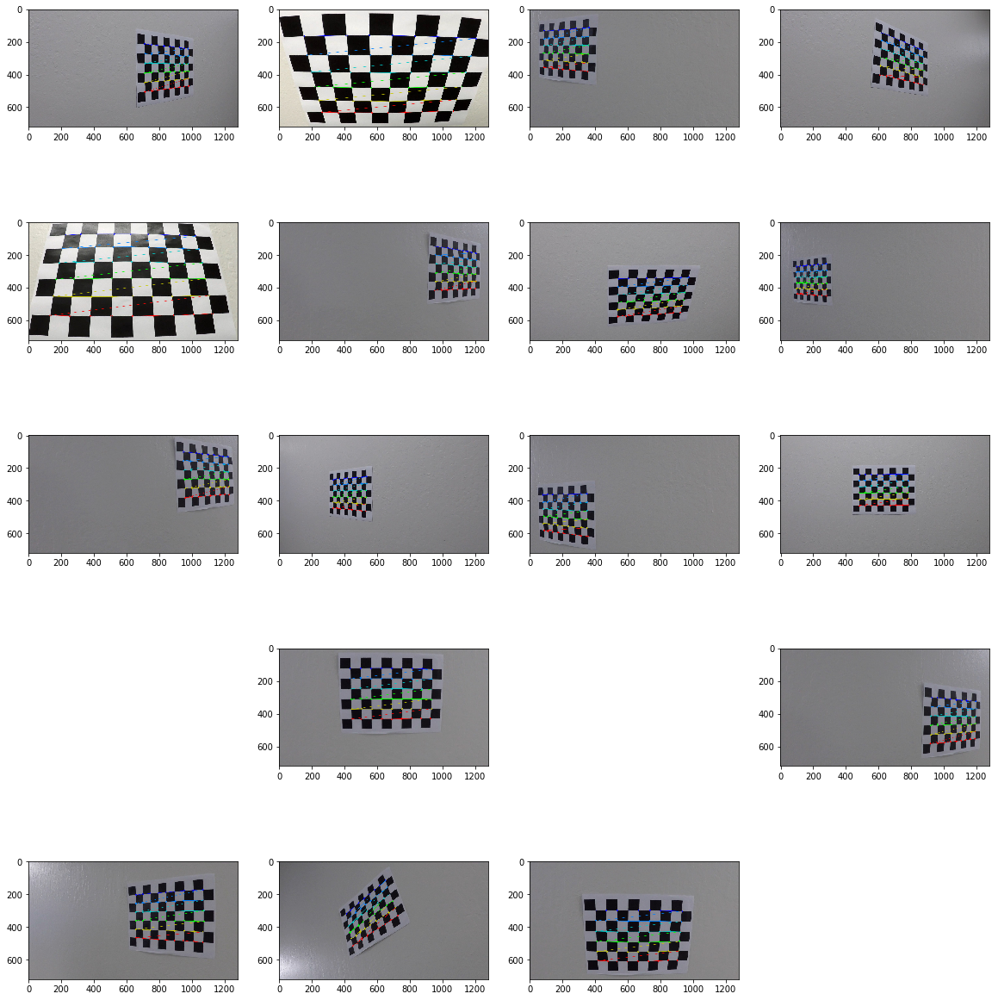

In [105]:
#Arrays to store object points and image points from all the image
objpoints = []
imgpoints = []
nx = 9 
ny = 6
#Prepare object points
objp = np.zeros((ny*nx,3),np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

images = glob.glob('camera_cal/calibration*.jpg')
plt.figure(figsize=(20, 22))

for i, image in enumerate(images):
    #Convert image to grayscale
    img = mpimg.imread(image)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret,corners = cv2.findChessboardCorners(gray,(nx,ny),None)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        img = cv2.drawChessboardCorners(img, (nx,ny), corners,ret)
        plt.subplot(len(images)//4, 4, i+1)
        plt.imshow(img)
print("objpoints.shape : ", np.array(objpoints).shape)
print("imgpoints.shape : ", np.array(imgpoints).shape)



In [106]:
def layout(original_img, output_img):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    if len(original_img.shape) ==2: 
        cmap1='gray'
    else:
        cmap1=None    
    ax1.imshow(original_img, cmap=cmap1)
    if i==0 : ax1.set_title('Original Image', fontsize=30)
    
    if len(output_img.shape) ==2: 
        cmap2='gray'
    else:
        cmap2=None    
    ax2.imshow(output_img, cmap=cmap2)

    if i==0 : ax2.set_title('Output Image', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

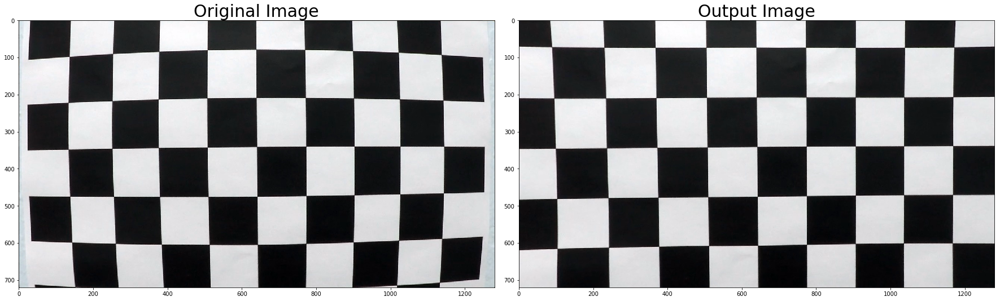

In [110]:
# Read in an image
image = cv2.imread('camera_cal/calibration1.jpg')

def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1],None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist
i=0
plt.show(layout(image,cal_undistort(image, objpoints, imgpoints)))

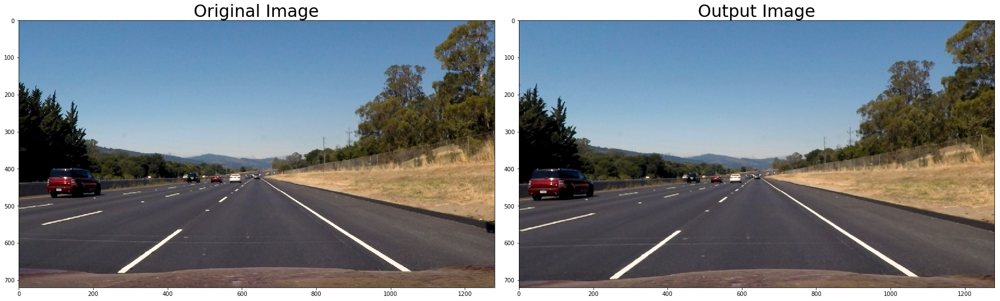

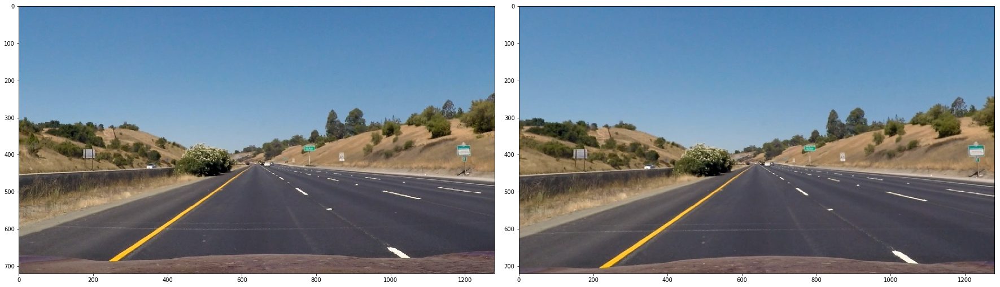

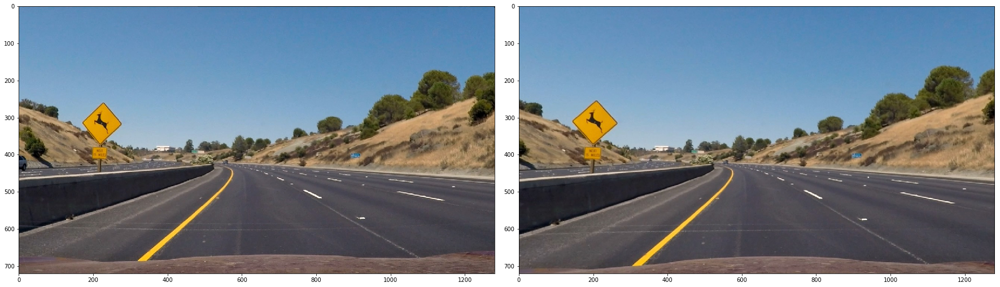

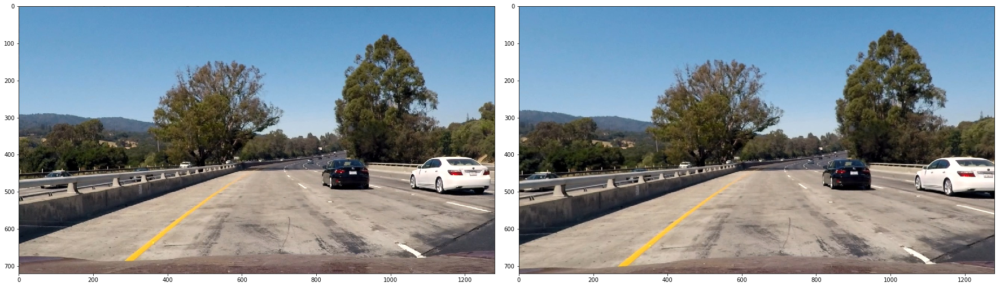

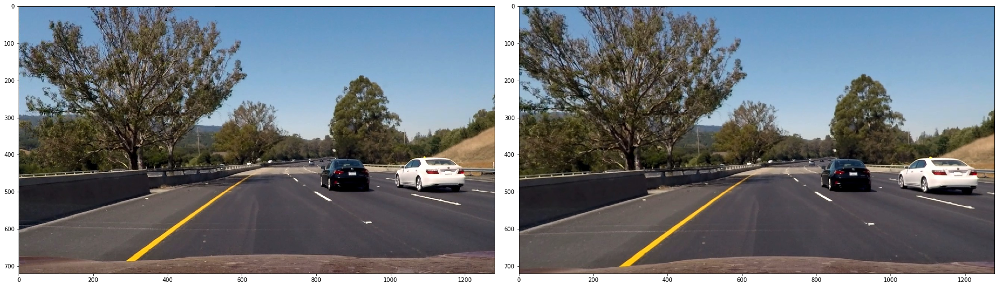

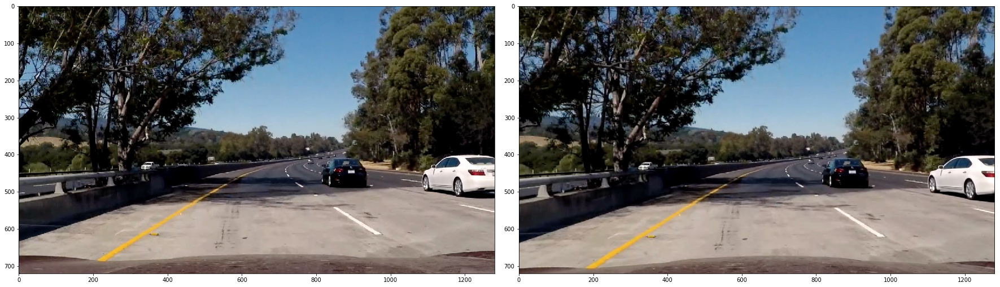

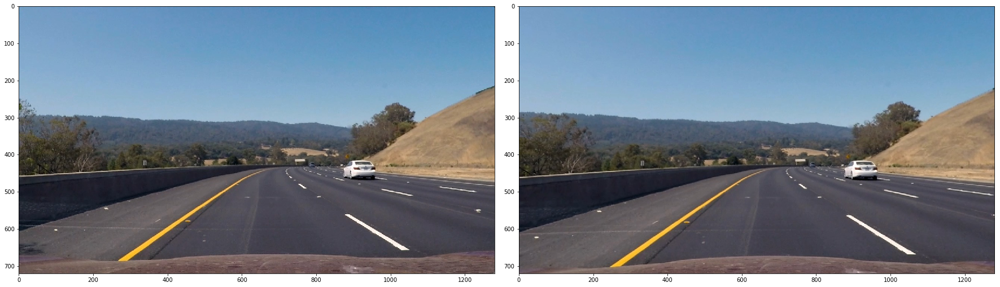

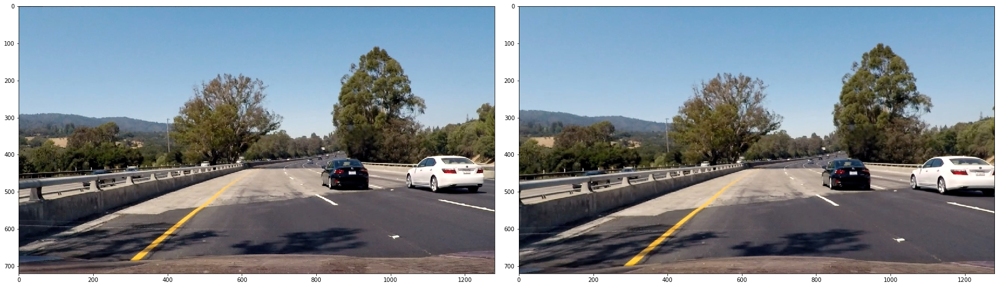

In [111]:
images = glob.glob('test_images/straight_lines*.jpg') + glob.glob('test_images/test*.jpg')
undistorted_array = np.zeros(np.append(0, mpimg.imread(images[0]).shape)) 
for i, image in enumerate(images):
    img = mpimg.imread(image)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    undistorted_array = np.append(undistorted_array, np.expand_dims(undistorted,axis=0), axis=0).astype(np.uint8)
    plt.show(layout(img, undistorted))

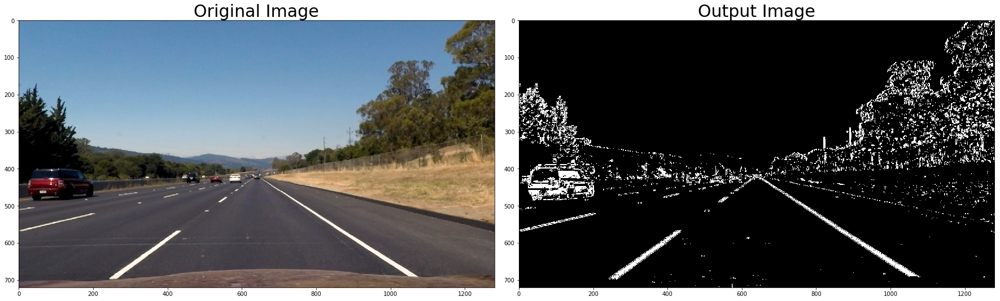

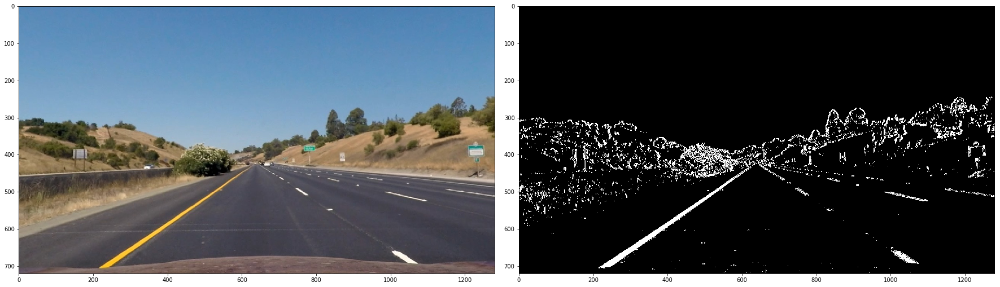

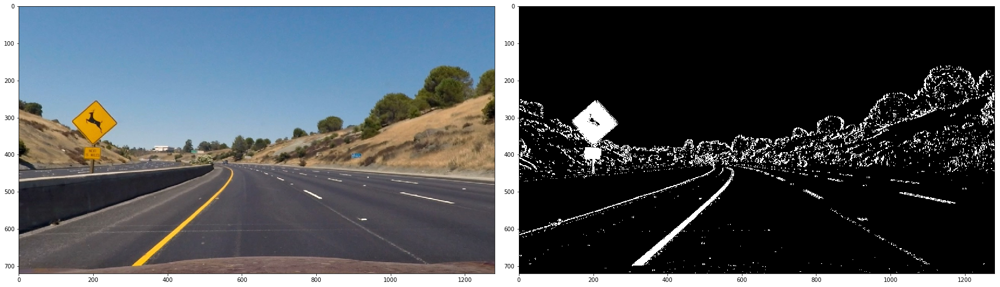

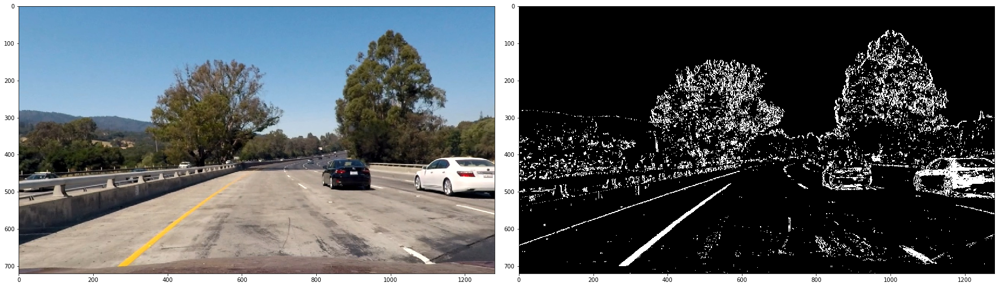

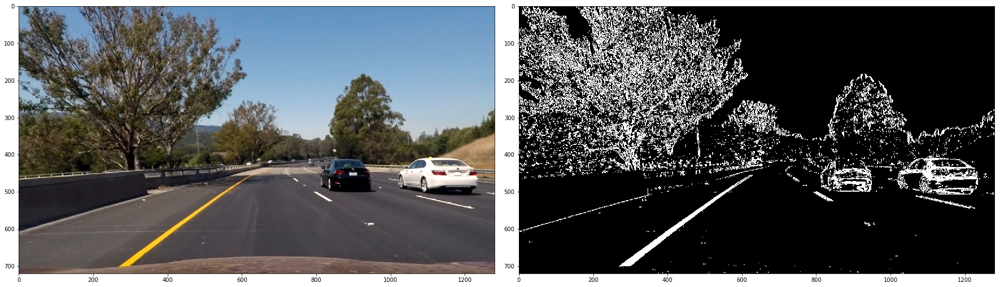

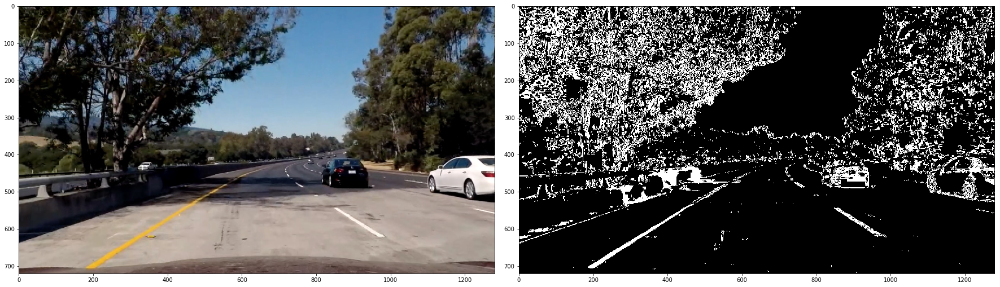

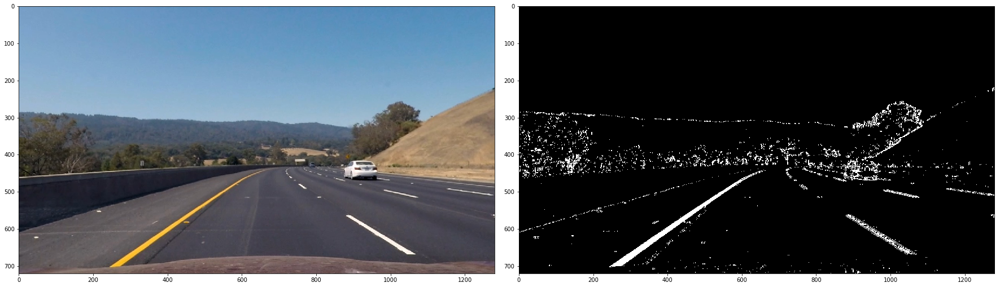

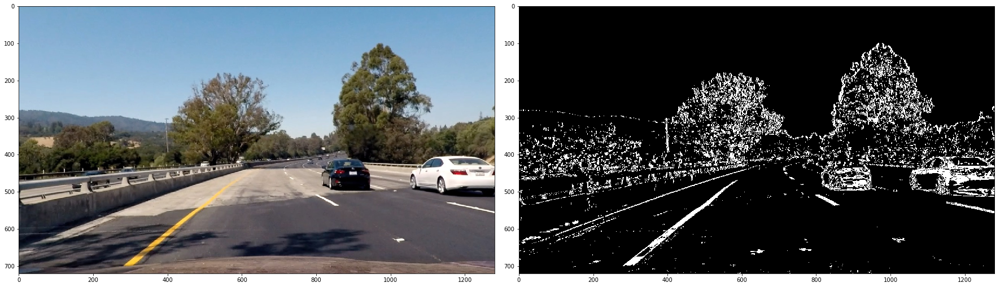

In [112]:
# Combined S channnel and gradient thresholds
def cal_convert(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary

combined_binary_array = np.zeros([0, undistorted_array[0].shape[0], undistorted_array[0].shape[1]]) 
for i, undistorted in enumerate(undistorted_array):
    combined_binary= cal_convert(undistorted)
    combined_binary_array = np.append(combined_binary_array, np.expand_dims(combined_binary,axis=0), axis=0).astype(np.uint8)
    plt.show(layout(undistorted, combined_binary))

In [113]:
image = cv2.imread('camera_cal/calibration1.jpg')
src = np.float32([[0.192*image.shape[1], 0.958*image.shape[0]],
                  [0.461*image.shape[1], 0.631*image.shape[0]],
                  [0.539*image.shape[1], 0.631*image.shape[0]],
                  [0.827*image.shape[1], 0.958*image.shape[0]]])
dst = np.float32([[0.18*image.shape[1], 1*image.shape[0]],
                  [0.18*image.shape[1], 0*image.shape[0]],
                  [0.8*image.shape[1], 0*image.shape[0]],
                  [0.8*image.shape[1], 1*image.shape[0]]])

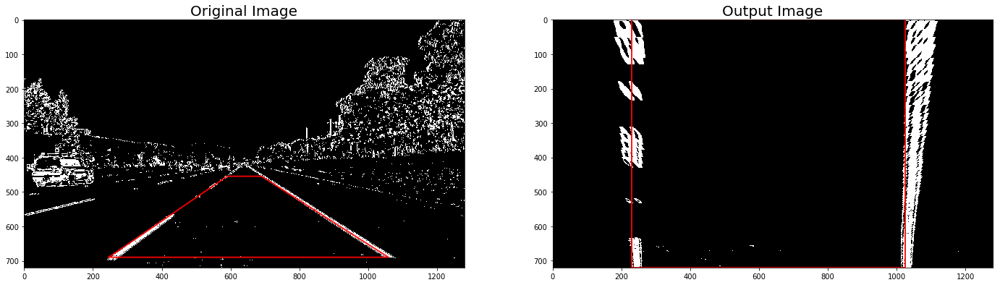

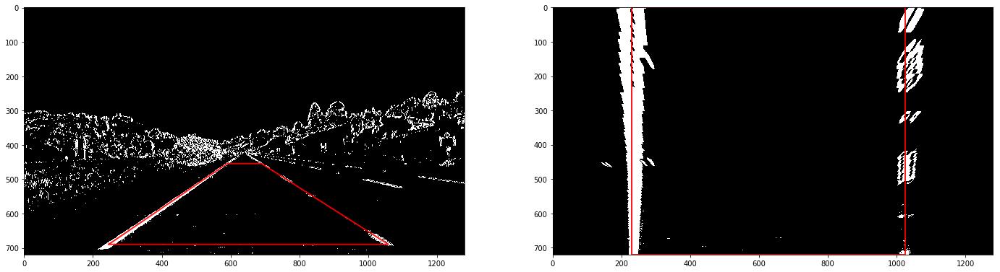

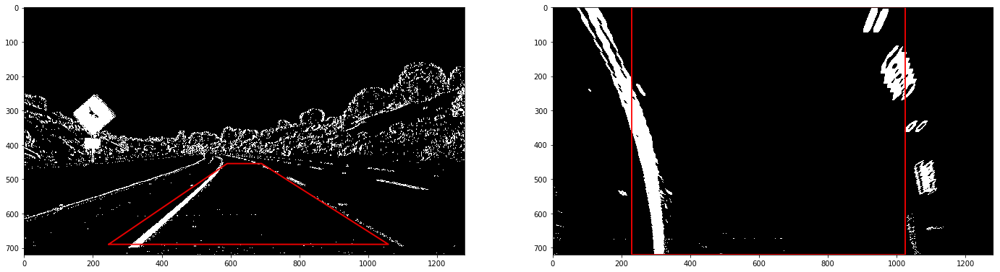

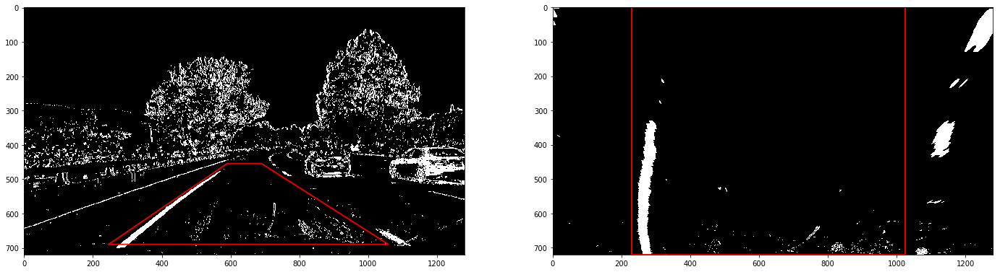

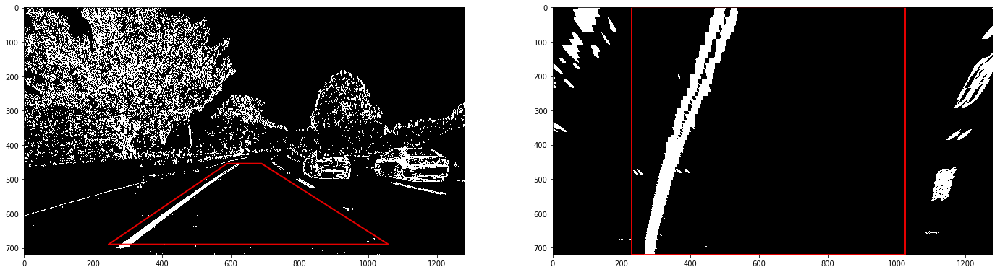

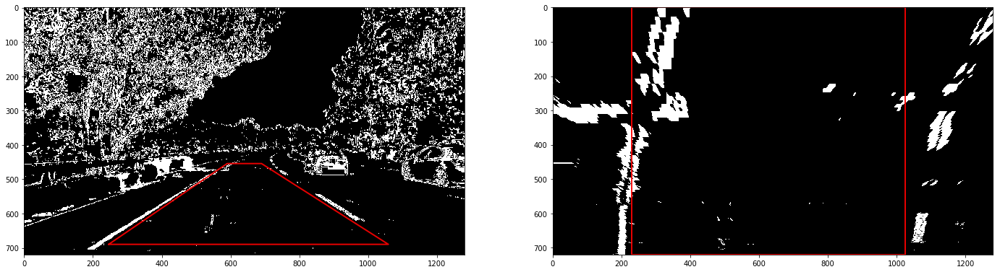

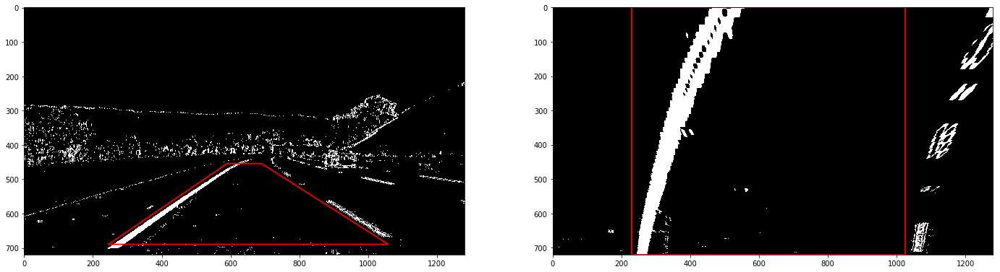

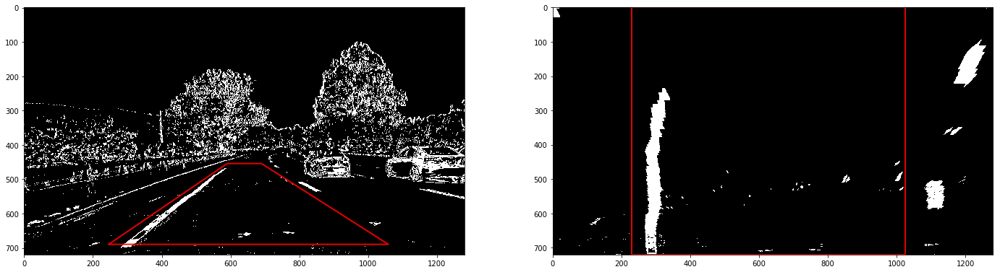

In [114]:
def cal_warp(img):
    img_size = img.shape[1],img.shape[0]  
    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # e) use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags= cv2.INTER_LINEAR)
    return warped

# For draw red line with below points
src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]

warped_array = np.zeros_like(combined_binary_array) # (8, 720, 1280)
for i, combined_binary in enumerate(combined_binary_array):
    # Warp the undistorted image (birds-eye view)
    warped = cal_warp(combined_binary)
    warped_array[i] = np.expand_dims(warped, axis=0).astype(np.uint8)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
    ax1.imshow(combined_binary, cmap='gray')
    ax1.plot(src_x, src_y, color='red', alpha=0.9, linewidth=2, solid_capstyle='round', zorder=2)
    if i==0 : ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(warped, cmap='gray')
    ax2.plot(dst_x, dst_y, color='red', alpha=0.9, linewidth=2, solid_capstyle='round', zorder=2)
    ax2.set_ylim([warped.shape[0], 0])
    if i==0 : ax2.set_title('Output Image', fontsize=20)

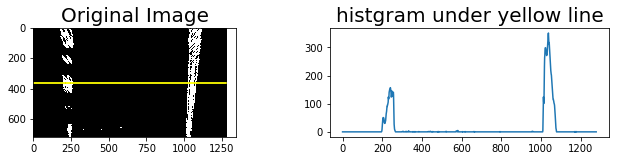

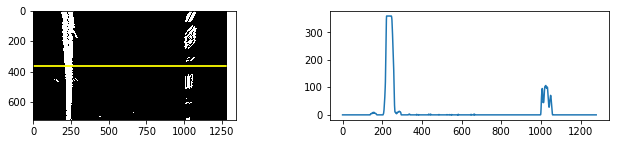

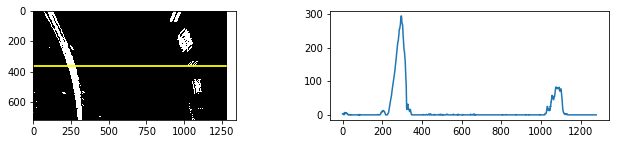

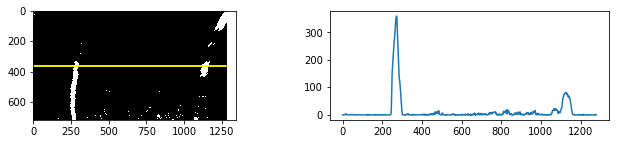

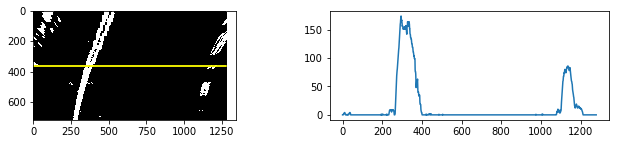

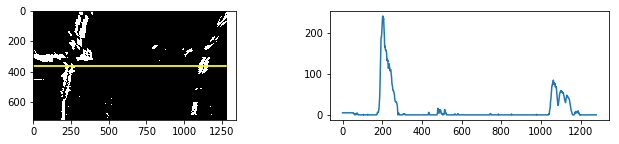

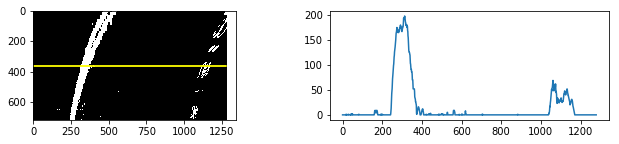

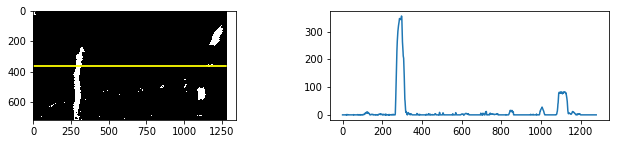

In [115]:
def hist(img):
    # Lane lines are likely to be mostly vertical nearest to the car
    y_criteria = img.shape[0]//2
    bottom_half = img[y_criteria:,:]
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half ,axis=0)    
    return histogram, y_criteria
    
for i, warped in enumerate(warped_array):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11,2))
    histgram, y_criteria = hist(warped)
    ax1.imshow(warped, cmap='gray')
    ax1.plot([0,warped.shape[1]], [y_criteria,y_criteria], color='yellow', alpha=0.9, linewidth=2, solid_capstyle='round', zorder=2)
    
    if i==0 : ax1.set_title('Original Image', fontsize=20)
    ax2.plot(histgram)
    if i==0 : ax2.set_title('histgram under yellow line', fontsize=20)

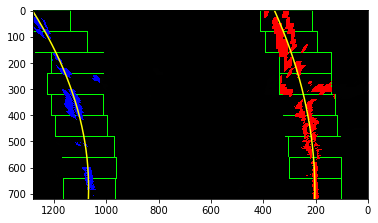

In [116]:
def find_sliding_window(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//3*2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # HYPERPARAMETERS # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
            
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        ### (`right` or `leftx_current`) on their mean position ###
        pass # Remove this when you add your function

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, leftx, lefty, rightx, righty, out_img

def draw_sliding_window(binary_warped, left_fit, right_fit, leftx, lefty, rightx, righty, out_img):

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = None
        right_fitx = None

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
#    plt.figure(figsize=(15,7))
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, binary_warped.shape[0])
    plt.xlim(binary_warped.shape[1], 0)    
    return out_img

#---------------------Test the image----------------------------------------------------------------#
i=5
left_fit, right_fit, leftx, lefty, rightx, righty, out_img = find_sliding_window(warped_array[i])
out_img2 = draw_sliding_window(out_img, left_fit, right_fit, leftx, lefty, rightx, righty, out_img)       
plt.imshow(out_img2, cmap='gray')       

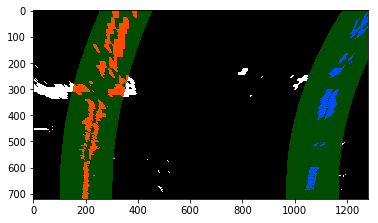

In [117]:
def search_around_poly(binary_warped,left_fit, right_fit):
    # HYPERPARAMETER
    margin = 100    
    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = None
        right_fitx = None
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)    
    ## End visualization steps ##   
    return result

#---------------------Test the image----------------------------------------------------------------#
i=5
left_fit, right_fit, leftx, lefty, rightx, righty, out_img = find_sliding_window(warped_array[i])
out_img2 = search_around_poly(warped_array[i], left_fit, right_fit)      
plt.imshow(out_img2, cmap='gray')

In [118]:
def measure_Curvature_and_CentorPosition(binary_warped,left_fit, right_fit):

    # -----------------calculate curvature-------------------------------
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )   
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)   
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # -----------------calculate Vehicle Centor offset ------------------------------- 
    left_x_eval = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    right_x_eval = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
    lane_ctr = (left_x_eval + right_x_eval)/2
    vehicle_ctr = (binary_warped.shape[1])/2 
    offset = (lane_ctr - vehicle_ctr) * xm_per_pix
    return left_curverad, right_curverad, offset

for i, warped in enumerate(warped_array):
    left_fit, right_fit, leftx, lefty, rightx, righty, out_img = find_sliding_window(warped)
    left_curverad, right_curverad, offset = measure_Curvature_and_CentorPosition(warped,left_fit, right_fit)
    print('left_curverad',left_curverad, 'm', '   right_curverad',right_curverad, 'm', '   offset', offset, 'm')

left_curverad 18381.6021768 m    right_curverad 10555.1674604 m    offset -0.0329048320408 m
left_curverad 10927.389652 m    right_curverad 11005.12533 m    offset -0.0596195138349 m
left_curverad 434.685967797 m    right_curverad 398.569220475 m    offset 0.279563124025 m
left_curverad 476.124711972 m    right_curverad 685.769562001 m    offset 0.130272741305 m
left_curverad 1022.46422244 m    right_curverad 2285.61235401 m    offset 0.176528325251 m
left_curverad 503.159114116 m    right_curverad 352.131339062 m    offset -0.0224956066328 m
left_curverad 613.032930471 m    right_curverad 724.281273777 m    offset 0.0993230035649 m
left_curverad 859.905699817 m    right_curverad 472.92780155 m    offset 0.276409642393 m


In [129]:
def unwarp(original_img, binary_warped, left_fit, right_fit):
        
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_pipe = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_pipe = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    green_zone = np.hstack((left_pipe, right_pipe))
    
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    cv2.fillPoly(color_warp, np.int_([green_zone]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([left_pipe]), isClosed=False, color=(255,255, 0), thickness=10)
    cv2.polylines(color_warp, np.int32([right_pipe]), isClosed=False, color=(255,255, 0), thickness=10)
    
    H,W = binary_warped.shape
    Minv = cv2.getPerspectiveTransform(dst, src) #Reverse the "srd, dst"
    re_warped = cv2.warpPerspective(color_warp, Minv, (W,H))#, flags= cv2.INTER_LINEAR)
    
    result = cv2.addWeighted(original_img, 1, re_warped, 0.5, 0)
    
    return result

for i, image in enumerate(images):
    img = mpimg.imread(image)
    undistorted = cal_undistort(img, objpoints, imgpoints)
    combined_binary= cal_convert(undistorted)
    warped = cal_warp(combined_binary)
    sliding_return = find_sliding_window(warped)
    left_fit = sliding_return[0]
    right_fit = sliding_return[1]
    result = unwarp(image, warped, left_fit, right_fit)
    
    plt.imshow(undistorted)
    plt.imshow(combined_binary)
    plt.imshow(warped)
    plt.imshow(result)
    
    # Plot the result
#    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
#    ax1.imshow(image)
#    ax1.set_title('Image', fontsize=30)
#    ax2.imshow(result)
#    ax2.set_title('Unwarped Image', fontsize=30)

TypeError: src1 is not a numpy array, neither a scalar